## Neurotransmitter analysis for the pre-synaptic inputs to "both" oviINr and oviIN_l

1. import the preprocessed inputs file from oviIN_combined file
2. import the oviIN_synapse file for the locations
3. merge those two dataframes
4. import the ovi_inputs neurotransmitter data and merge onto larger dataframe
5. create color map so that excitatory vs inhibitory neurotransmitters are different colors
6. create skeleton and plot

This process is then repeated for the outputs but all the code was put into one function

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import bokeh
import bokeh.palettes
from bokeh.plotting import figure, output_notebook, show, output_file
from bokeh.io import export_svg, export_png
from bokeh.models import Legend, LegendItem
import os
from neuprint import Client


auth_token_file = open("/Users/rhessa/flybrain-clustering/flybrain.auth.txt", 'r')
auth_token = next(auth_token_file).strip()
try:
    np_client = Client('neuprint.janelia.org', dataset='hemibrain:v1.2.1', token=auth_token)
except:
    np_client = None

output_notebook()

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Loading BokehJS ...

### Inputs

In [2]:
# Create skeleton for later usage (inspired from Prof G.'s notebook ovi_specs_sandbox.ipynb)
# body Ids of oviINs
ovi_r = 423101189
ovi_l = 485934965

ovis = [ovi_r, ovi_l]
# cretae skeleton for both oviINs
skeletons = []

for i in ovis:
    s = np_client.fetch_skeleton(i, format='pandas')
    s['bodyId'] = i
    s['color'] = bokeh.palettes.Greys[3][1]
    skeletons.append(s)

skeletons = pd.concat(skeletons, ignore_index=True)

# Join parent nodes
segments = skeletons.merge(skeletons, left_on=['bodyId', 'link'], right_on=['bodyId', 'rowId'], suffixes=['_child', '_parent'])



In [32]:
# Show skeleton as a check and later usage
#p = figure(title = 'Both oviINs')
#p.y_range.flipped = True

# Plot the skeleton (2d)
#p.segment(x0='x_child', y0='z_child', x1='x_parent', y1='z_parent', color='color_child', source=segments) 

#show(p)

In [30]:
# import preprocessed inputs file
ovi_HB_node_df  = pd.read_csv('/Users/rhessa/flybrain-clustering/oviIN_combined/preprocessed_inputs-v1.2.1/preprocessed_nodes.csv')

In [5]:
# Refine the dataframe to only include modules, celltype and id
celltype_df = ovi_HB_node_df[['id', '0.0', '0.1', '0.25', '0.5', '0.75', 'celltype']].copy()
celltype_df

,id,0.0,0.1,0.25,0.5,0.75,celltype
0,1003215282,1,1,1,1,1,CL229
1,1005952640,2,2,2,2,2,IB058
2,1006928515,1,1,3,3,3,CL300
3,1007260806,1,1,3,4,4,CL301
4,1007644534,1,1,1,5,5,NaN
...,...,...,...,...,...,...,...
3738,988567837,2,5,14,82,86,FB4G
3739,988653659,2,238,431,636,1235,NaN
3740,988654188,5,288,185,287,375,NaN
3741,988909130,2,5,14,645,90,FB5V


In [6]:
# Import synapse location data
ovi_pre_syns = pd.read_csv('/Users/rhessa/flybrain-clustering/ovi_pre_syns.csv', index_col=0)
ovi_pre_syns

,bodyId_pre,bodyId_post,roi_pre,roi_post,x_pre,y_pre,z_pre,x_post,y_post,z_post,confidence_pre,confidence_post,type_pre,type_post
0,989228019,423101189,CRE(R),CRE(R),22857,34611,17485,22825,34624,17464,0.998,0.633171,FB5V,NaN
1,988909130,423101189,CRE(R),CRE(R),19523,31096,21707,19509,31112,21693,0.969,0.528840,FB5V,NaN
2,988567837,423101189,LAL(R),LAL(R),23100,27659,23824,23074,27659,23801,0.970,0.459446,FB4G,NaN
3,987842109,423101189,SMP(R),SMP(R),19041,33090,14598,19047,33072,14598,0.973,0.974019,NaN,NaN
4,987273073,423101189,CRE(R),CRE(R),19347,27826,15348,19351,27806,15376,0.943,0.595921,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21619,1006928515,423101189,IB,IB,22664,14840,19749,22651,14823,19757,0.994,0.865103,CL300,NaN
21620,1005952640,423101189,IB,IB,21998,15625,18990,22007,15603,18991,0.996,0.929040,IB058,NaN
21621,1005952640,423101189,IB,IB,22998,15275,23049,23014,15272,23060,0.835,0.780000,IB058,NaN
21622,1005952640,423101189,IB,IB,23034,15380,23131,23048,15364,23146,0.986,0.905853,IB058,NaN


In [7]:
# Merge to create larger dataframe
ovi_pre_locs = ovi_pre_syns.merge(celltype_df, how = 'inner', left_on='bodyId_pre', right_on='id')
ovi_pre_locs

,bodyId_pre,bodyId_post,roi_pre,roi_post,x_pre,y_pre,z_pre,x_post,y_post,z_post,...,confidence_post,type_pre,type_post,id,0.0,0.1,0.25,0.5,0.75,celltype
0,989228019,423101189,CRE(R),CRE(R),22857,34611,17485,22825,34624,17464,...,0.633171,FB5V,NaN,989228019,2,5,14,645,90,FB5V
1,988909130,423101189,CRE(R),CRE(R),19523,31096,21707,19509,31112,21693,...,0.528840,FB5V,NaN,988909130,2,5,14,645,90,FB5V
2,988567837,423101189,LAL(R),LAL(R),23100,27659,23824,23074,27659,23801,...,0.459446,FB4G,NaN,988567837,2,5,14,82,86,FB4G
3,987842109,423101189,SMP(R),SMP(R),19041,33090,14598,19047,33072,14598,...,0.974019,NaN,NaN,987842109,4,297,524,877,1232,NaN
4,987273073,423101189,CRE(R),CRE(R),19347,27826,15348,19351,27806,15376,...,0.595921,NaN,NaN,987273073,4,19,28,36,909,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21619,1006928515,423101189,IB,IB,22664,14840,19749,22651,14823,19757,...,0.865103,CL300,NaN,1006928515,1,1,3,3,3,CL300
21620,1005952640,423101189,IB,IB,21998,15625,18990,22007,15603,18991,...,0.929040,IB058,NaN,1005952640,2,2,2,2,2,IB058
21621,1005952640,423101189,IB,IB,22998,15275,23049,23014,15272,23060,...,0.780000,IB058,NaN,1005952640,2,2,2,2,2,IB058
21622,1005952640,423101189,IB,IB,23034,15380,23131,23048,15364,23146,...,0.905853,IB058,NaN,1005952640,2,2,2,2,2,IB058


In [8]:
# import neurotransmitter info
ovi_nt_info = pd.read_csv('/Users/rhessa/flybrain-clustering/ovi_input_types.csv')
ovi_nt_info_refined = ovi_nt_info[['type_pre', 'neurotransmitter']].copy()
ovi_nt_info_refined

,type_pre,neurotransmitter
0,FS1A,ACH
1,SMP052,ACH
2,IB017,ACH
3,SMP176,ACH
4,SMP383,ACH
...,...,...
1044,SMP216,NaN
1045,CRE088,NaN
1046,LHAV9a1_c,NaN
1047,SMP038,GLUT


In [9]:
# merge to create complete dataframe, ready for plotting
ovi_r_comp = ovi_pre_locs.merge(ovi_nt_info_refined, left_on='type_pre', right_on='type_pre')
ovi_r_comp = ovi_r_comp.fillna('Unknown')
ovi_r_comp

,bodyId_pre,bodyId_post,roi_pre,roi_post,x_pre,y_pre,z_pre,x_post,y_post,z_post,...,type_pre,type_post,id,0.0,0.1,0.25,0.5,0.75,celltype,neurotransmitter
0,989228019,423101189,CRE(R),CRE(R),22857,34611,17485,22825,34624,17464,...,FB5V,Unknown,989228019,2,5,14,645,90,FB5V,GLUT
1,988909130,423101189,CRE(R),CRE(R),19523,31096,21707,19509,31112,21693,...,FB5V,Unknown,988909130,2,5,14,645,90,FB5V,GLUT
2,926490072,423101189,CRE(R),CRE(R),21622,35481,20533,21614,35460,20539,...,FB5V,Unknown,926490072,2,5,14,645,90,FB5V,GLUT
3,926490072,423101189,CRE(R),CRE(R),20720,35019,20150,20710,35020,20127,...,FB5V,Unknown,926490072,2,5,14,645,90,FB5V,GLUT
4,926490072,423101189,CRE(R),CRE(R),20697,35105,20224,20677,35093,20229,...,FB5V,Unknown,926490072,2,5,14,645,90,FB5V,GLUT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17209,1008024276,423101189,CRE(R),CRE(R),22722,34402,18357,22727,34375,18371,...,FB5N,Unknown,1008024276,3,3,4,6,6,FB5N,GLUT
17210,1005952640,423101189,IB,IB,21998,15625,18990,22007,15603,18991,...,IB058,Unknown,1005952640,2,2,2,2,2,IB058,GLUT
17211,1005952640,423101189,IB,IB,22998,15275,23049,23014,15272,23060,...,IB058,Unknown,1005952640,2,2,2,2,2,IB058,GLUT
17212,1005952640,423101189,IB,IB,23034,15380,23131,23048,15364,23146,...,IB058,Unknown,1005952640,2,2,2,2,2,IB058,GLUT


In [10]:
# create colormap for plotting
# This will be 3 colors for excitatory, inhibitory and unknown
colormap = {'GLUT': 'red',
            'GLUT (L)': 'red',
            'GLUT (R)': 'red',
            'ACH': 'red', 
            'ACH*': 'red', 
            'ACH left': 'red', 
            'ACH, GLUT': 'red',
            'NE': 'red', 
            'GLUT (R) ACH (L)': 'red', 
            'GLUT (L) ACH (R)': 'red', 
            'GLUT (R) GLUT (L) ACH (R)': 'red',
            'GLUT (L) ACH (L) GLUT (R) ACH (R)': 'red',
            'GABA': 'blue',
            'GABA (L)': 'blue',
            'SER': 'blue',
            'SER (R)': 'blue',
            'SER (L) DA (R)': 'blue',
            'DA': 'blue',
            'DA (L)': 'blue',
            'DA (R)': 'blue',
            'DA, SER(L)': 'blue', 
            'ACH (L) SER (R)': 'green',
            'SER, GLUT': 'green',
            'SER (L) GLUT (L)': 'green',
            'SER (R) ACH (L)': 'green',
            'GLUT (R) DA (L)': 'green',
            'GLUT (R) SER (L) GLUT (L)': 'green',
            'ACH (L) DA (R)': 'green',
            'SER (L) GLUT (L) SER (R) GLUT (R)': 'green',
            'DA (R) ACH (R) GLUT (R)': 'green',
            'DA (R) GLUT (L)': 'green',
            'GLUT (R) SER (L)': 'green',
            'GLUT (L) SER (R)': 'green',
            'GLUT (L & R) SER (L) ACH (L&R)': 'green',
            'GLUT (L) SER (L) GLUT (R) ACH (R) ACH (L)': 'green',
            'GLUT (R) GLUT (L) SER (L)': 'green',
            'SER GLUT (L)': 'green',
            'GABA (L) GLUT (L)': 'green',
            'SER, GLUT': 'green',
            'OCT':'pink',
            'OCT (C)':'pink',
            'Unknown': 'black'}
colormap # check colormap

{'GLUT': 'red',
 'GLUT (L)': 'red',
 'GLUT (R)': 'red',
 'ACH': 'red',
 'ACH*': 'red',
 'ACH left': 'red',
 'ACH, GLUT': 'red',
 'NE': 'red',
 'GLUT (R) ACH (L)': 'red',
 'GLUT (L) ACH (R)': 'red',
 'GLUT (R) GLUT (L) ACH (R)': 'red',
 'GLUT (L) ACH (L) GLUT (R) ACH (R)': 'red',
 'GABA': 'blue',
 'GABA (L)': 'blue',
 'SER': 'blue',
 'SER (R)': 'blue',
 'SER (L) DA (R)': 'blue',
 'DA': 'blue',
 'DA (L)': 'blue',
 'DA (R)': 'blue',
 'DA, SER(L)': 'blue',
 'ACH (L) SER (R)': 'green',
 'SER, GLUT': 'green',
 'SER (L) GLUT (L)': 'green',
 'SER (R) ACH (L)': 'green',
 'GLUT (R) DA (L)': 'green',
 'GLUT (R) SER (L) GLUT (L)': 'green',
 'ACH (L) DA (R)': 'green',
 'SER (L) GLUT (L) SER (R) GLUT (R)': 'green',
 'DA (R) ACH (R) GLUT (R)': 'green',
 'DA (R) GLUT (L)': 'green',
 'GLUT (R) SER (L)': 'green',
 'GLUT (L) SER (R)': 'green',
 'GLUT (L & R) SER (L) ACH (L&R)': 'green',
 'GLUT (L) SER (L) GLUT (R) ACH (R) ACH (L)': 'green',
 'GLUT (R) GLUT (L) SER (L)': 'green',
 'SER GLUT (L)': 'green',

In [11]:
# Add colormap info to dataframe
ovi_r_comp['color'] = ovi_r_comp['neurotransmitter'].map(colormap)
ovi_r_comp

,bodyId_pre,bodyId_post,roi_pre,roi_post,x_pre,y_pre,z_pre,x_post,y_post,z_post,...,type_post,id,0.0,0.1,0.25,0.5,0.75,celltype,neurotransmitter,color
0,989228019,423101189,CRE(R),CRE(R),22857,34611,17485,22825,34624,17464,...,Unknown,989228019,2,5,14,645,90,FB5V,GLUT,red
1,988909130,423101189,CRE(R),CRE(R),19523,31096,21707,19509,31112,21693,...,Unknown,988909130,2,5,14,645,90,FB5V,GLUT,red
2,926490072,423101189,CRE(R),CRE(R),21622,35481,20533,21614,35460,20539,...,Unknown,926490072,2,5,14,645,90,FB5V,GLUT,red
3,926490072,423101189,CRE(R),CRE(R),20720,35019,20150,20710,35020,20127,...,Unknown,926490072,2,5,14,645,90,FB5V,GLUT,red
4,926490072,423101189,CRE(R),CRE(R),20697,35105,20224,20677,35093,20229,...,Unknown,926490072,2,5,14,645,90,FB5V,GLUT,red
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17209,1008024276,423101189,CRE(R),CRE(R),22722,34402,18357,22727,34375,18371,...,Unknown,1008024276,3,3,4,6,6,FB5N,GLUT,red
17210,1005952640,423101189,IB,IB,21998,15625,18990,22007,15603,18991,...,Unknown,1005952640,2,2,2,2,2,IB058,GLUT,red
17211,1005952640,423101189,IB,IB,22998,15275,23049,23014,15272,23060,...,Unknown,1005952640,2,2,2,2,2,IB058,GLUT,red
17212,1005952640,423101189,IB,IB,23034,15380,23131,23048,15364,23146,...,Unknown,1005952640,2,2,2,2,2,IB058,GLUT,red


In [27]:
ovi_red = ovi_r_comp[ovi_r_comp['color']=='red']
ovi_blue = ovi_r_comp[ovi_r_comp['color']=='blue']
ovi_green = ovi_r_comp[ovi_r_comp['color']=='green']
ovi_black = ovi_r_comp[ovi_r_comp['color']=='black']
ovi_pink = ovi_r_comp[ovi_r_comp['color']=='pink']

In [28]:
ovi_red

,bodyId_pre,bodyId_post,roi_pre,roi_post,x_pre,y_pre,z_pre,x_post,y_post,z_post,...,type_post,id,0.0,0.1,0.25,0.5,0.75,celltype,neurotransmitter,color
0,989228019,423101189,CRE(R),CRE(R),22857,34611,17485,22825,34624,17464,...,Unknown,989228019,2,5,14,645,90,FB5V,GLUT,red
1,988909130,423101189,CRE(R),CRE(R),19523,31096,21707,19509,31112,21693,...,Unknown,988909130,2,5,14,645,90,FB5V,GLUT,red
2,926490072,423101189,CRE(R),CRE(R),21622,35481,20533,21614,35460,20539,...,Unknown,926490072,2,5,14,645,90,FB5V,GLUT,red
3,926490072,423101189,CRE(R),CRE(R),20720,35019,20150,20710,35020,20127,...,Unknown,926490072,2,5,14,645,90,FB5V,GLUT,red
4,926490072,423101189,CRE(R),CRE(R),20697,35105,20224,20677,35093,20229,...,Unknown,926490072,2,5,14,645,90,FB5V,GLUT,red
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17208,1013066710,423101189,LAL(R),LAL(R),18875,27759,20338,18862,27757,20326,...,Unknown,1013066710,2,5,14,17,20,CRE071,ACH,red
17209,1008024276,423101189,CRE(R),CRE(R),22722,34402,18357,22727,34375,18371,...,Unknown,1008024276,3,3,4,6,6,FB5N,GLUT,red
17210,1005952640,423101189,IB,IB,21998,15625,18990,22007,15603,18991,...,Unknown,1005952640,2,2,2,2,2,IB058,GLUT,red
17211,1005952640,423101189,IB,IB,22998,15275,23049,23014,15272,23060,...,Unknown,1005952640,2,2,2,2,2,IB058,GLUT,red


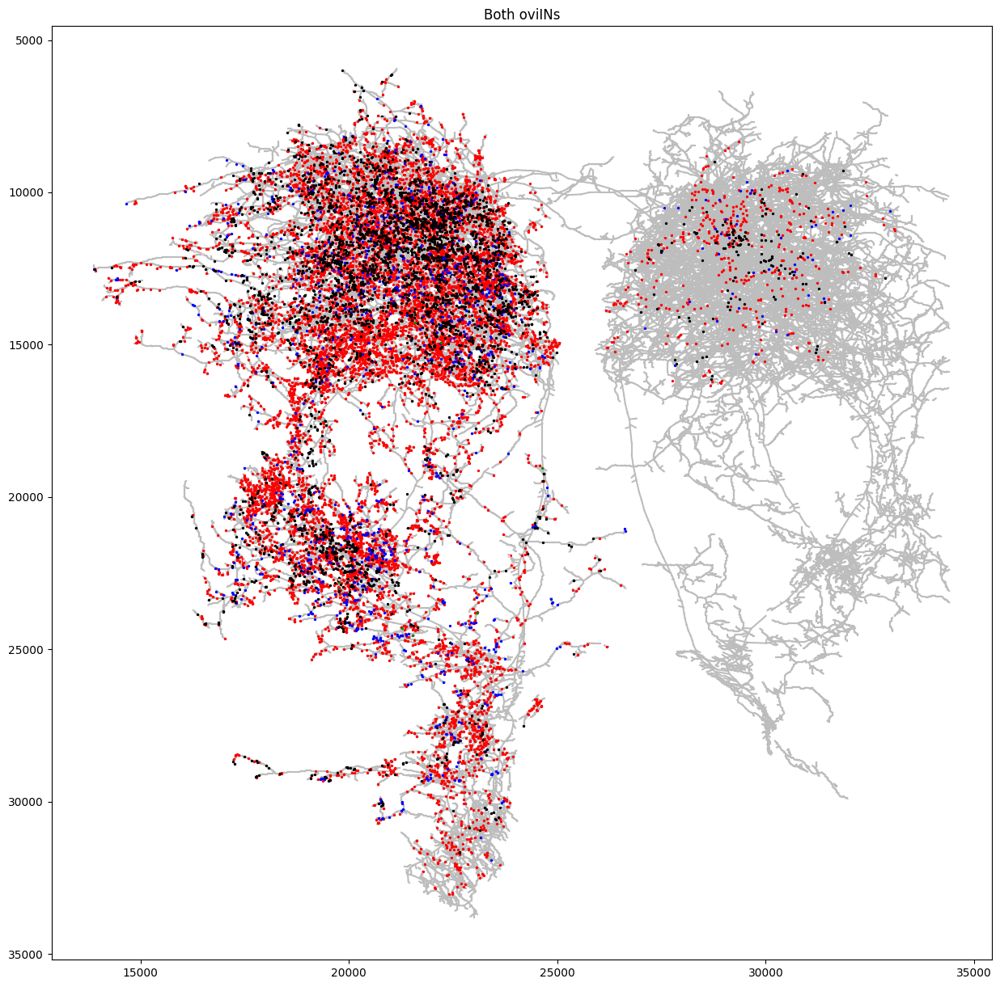

In [38]:
fig, ax = plt.subplots(figsize=(15, 15))
ax.set_title('Both oviINs')
ax.invert_yaxis()  # Flip the y-axis

# Plot the skeleton (2D)
for index, row in segments.iterrows():
    ax.plot([row['x_child'], row['x_parent']], [row['z_child'], row['z_parent']], color=row['color_child'], zorder=1)

ax.scatter(ovi_red['x_post'], ovi_red['z_post'], color='red', s=2, zorder=10)
ax.scatter(ovi_blue['x_post'], ovi_blue['z_post'], color='blue', s=2, zorder=10)
ax.scatter(ovi_green['x_post'], ovi_green['z_post'], color='green', s=2, zorder=10)
ax.scatter(ovi_black['x_post'], ovi_black['z_post'], color='black', s=2, zorder=10)
ax.scatter(ovi_pink['x_post'], ovi_pink['z_post'], color='pink', s=2, zorder=10)

plt.show()

In [ ]:
ax.scatter(ovi_red['x_post'], ovi_red['z_post'], color='red', s=0.5)
ax.scatter(ovi_blue['x_post'], ovi_blue['z_post'], color='blue', s=0.5)
ax.scatter(ovi_green['x_post'], ovi_green['z_post'], color='green', s=0.5)
ax.scatter(ovi_black['x_post'], ovi_black['z_post'], color='black', s=0.5)
ax.scatter(ovi_pink['x_post'], ovi_pink['z_post'], color='pink', s=0.5)

### Outputs
Process is repeated using a function, shouldn't take longer than 5 seconds total

If not, close notebook and restart kernel (bokeh gets bugged sometimes)

In [41]:
# Repeat process for outputs
def create_skeleton_outputs():
    # Pull all neuron data from files
    ovi_HB_node_df  = pd.read_csv('/Users/rhessa/flybrain-clustering/oviIN_combined/preprocessed_outputs-v1.2.1/preprocessed_nodes.csv')
    celltype_df = ovi_HB_node_df[['id', '0.0', '0.1', '0.25', '0.5', '0.75', 'celltype']].copy()
    ovi_post_syns = pd.read_csv('/Users/rhessa/flybrain-clustering/ovi_post_syns.csv', index_col=0)
    ovi_post_locs = ovi_post_syns.merge(celltype_df, how = 'inner', left_on='bodyId_pre', right_on='id')
    ovi_nt_info = pd.read_csv('/Users/rhessa/flybrain-clustering/ovi_output_types.csv')
    ovi_nt_info_refined = ovi_nt_info[['type_post', 'neurotransmitter']].copy()

    # Create complete dataframe
    ovi_l = ovi_post_locs.merge(ovi_nt_info_refined, left_on='type_post', right_on='type_post')
    ovi_l = ovi_l.fillna('Unknown')

    # create output colormap
    colormap = {'GLUT': 'red',
                'GLUT (L)': 'red',
                'GLUT (R)': 'red',
            'ACH': 'red', 
            'ACH*': 'red', 
            'ACH left': 'red', 
            'ACH, GLUT': 'red',
            'NE': 'red', 
            'GLUT (R) ACH (L)': 'red', 
            'GLUT (L) ACH (R)': 'red', 
            'GLUT (R) GLUT (L) ACH (R)': 'red',
            'GLUT (L) ACH (L) GLUT (R) ACH (R)': 'red',
            'GABA': 'blue',
            'GABA (L)': 'blue',
            'SER': 'blue',
            'SER (R)': 'blue',
            'SER (L) DA (R)': 'blue',
            'DA': 'blue',
            'DA (L)': 'blue',
            'DA (R)': 'blue',
            'DA, SER(L)': 'blue', 
            'ACH (L) SER (R)': 'green',
            'SER, GLUT': 'green',
            'SER (L) GLUT (L)': 'green',
            'SER (R) ACH (L)': 'green',
            'GLUT (R) DA (L)': 'green',
            'GLUT (R) SER (L) GLUT (L)': 'green',
            'ACH (L) DA (R)': 'green',
            'SER (L) GLUT (L) SER (R) GLUT (R)': 'green',
            'DA (R) ACH (R) GLUT (R)': 'green',
            'DA (R) GLUT (L)': 'green',
            'GLUT (R) SER (L)': 'green',
            'GLUT (L) SER (R)': 'green',
            'GLUT (L & R) SER (L) ACH (L&R)': 'green',
            'GLUT (L) SER (L) GLUT (R) ACH (R) ACH (L)': 'green',
            'GLUT (R) GLUT (L) SER (L)': 'green',
            'SER GLUT (L)': 'green',
            'GABA (L) GLUT (L)': 'green',
            'SER, GLUT': 'green',
            'OCT':'pink',
            'OCT (C)':'pink',
            'Unknown': 'black'}
    # Add colormap info to dataframe
    ovi_l['color'] = ovi_l['neurotransmitter'].map(colormap)
    ovi_red = ovi_l[ovi_l['color']=='red']
    ovi_blue = ovi_l[ovi_l['color']=='blue']
    ovi_green = ovi_l[ovi_l['color']=='green']
    ovi_black = ovi_l[ovi_l['color']=='black']
    ovi_pink = ovi_l[ovi_l['color']=='pink']

    fig, ax = plt.subplots(figsize=(15, 15))
    ax.set_title('Both oviINs')
    ax.invert_yaxis()  # Flip the y-axis

    for index, row in segments.iterrows():
        ax.plot([row['x_child'], row['x_parent']], [row['z_child'], row['z_parent']], color=row['color_child'], zorder=1)

    ax.scatter(ovi_red['x_post'], ovi_red['z_post'], color='red', s=2, zorder=10)
    ax.scatter(ovi_blue['x_post'], ovi_blue['z_post'], color='blue', s=2, zorder=10)
    ax.scatter(ovi_green['x_post'], ovi_green['z_post'], color='green', s=2, zorder=10)
    ax.scatter(ovi_black['x_post'], ovi_black['z_post'], color='black', s=2, zorder=10)
    ax.scatter(ovi_pink['x_post'], ovi_pink['z_post'], color='pink', s=2, zorder=10)
    # Plot the skeleton (2D)
    
    

    plt.show()

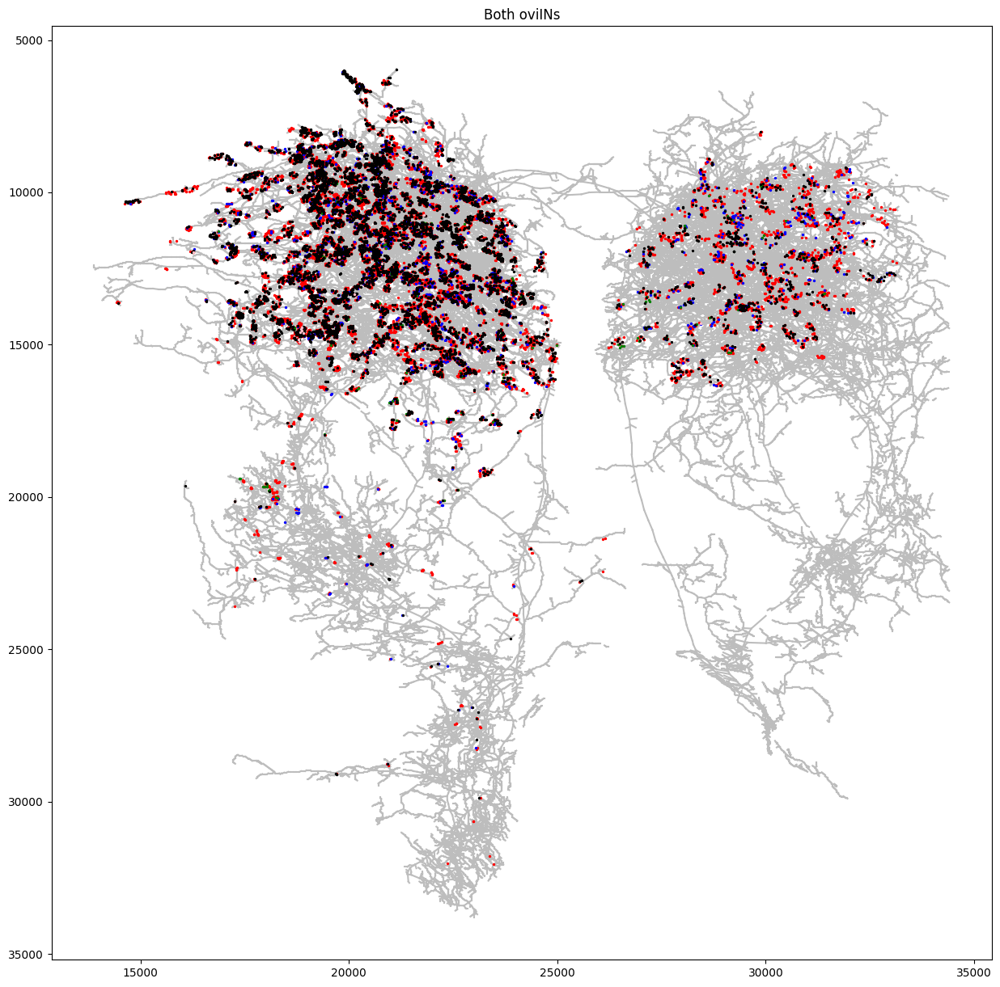

In [42]:
# Should take max 5 seconds to run
create_skeleton_outputs()